In [2]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random

In [3]:
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
base_model.summary()

87916544/87910968 [==============================] - 3s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, 3 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 3 0           batch_normalization[0][0]        
______________________

In [4]:
# Maximize the activation of these layers
names = ['mixed3', 'mixed5']

In [5]:
layers = [base_model.get_layer(name).output for name in names]

In [6]:
deepdream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

In [7]:
Sample_Image = tf.keras.preprocessing.image.load_img(r'/content/drive/My Drive/Colab Notebooks/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg', target_size=(225, 375))

In [8]:
Sample_Image = np.array(Sample_Image)/255.0
Sample_Image = tf.keras.preprocessing.image.img_to_array(Sample_Image)

In [9]:
Sample_Image = tf.Variable(tf.keras.applications.inception_v3.preprocess_input(Sample_Image))

In [10]:
Sample_Image = tf.expand_dims(Sample_Image, axis=0)
np.shape(Sample_Image)

TensorShape([1, 225, 375, 3])

In [11]:
activations = deepdream_model(Sample_Image)

In [12]:
def calc_loss(image, model):
  # convert to batch format
  img_batch = tf.expand_dims(image, axis=0)
  # run the model
  layer_activations = model(img_batch)
  print('Activation Values (Layer Output) = \n', layer_activations)
  print('Activation Shape = \n', np.shape(layer_activations))

  # create an empty array to accumulate the losses
  losses = []
  for act in layer_activations:
    # calculate the mean of each activation
    loss = tf.math.reduce_mean(act)
    losses.append(loss)

  print('Losses (from multiple activation layers = )', losses)
  print('Losses shape (from multiple activation layers =)', np.shape(losses))
  print('Sum of all losses (from all selected layers=)', tf.reduce_sum(losses))

  # calcualte sum
  return tf.reduce_sum(losses)

In [14]:
Sample_Image= tf.keras.preprocessing.image.load_img(r'/content/drive/My Drive/Colab Notebooks/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg', target_size = (225, 375))
Sample_Image = np.array(Sample_Image)/255.0
Sample_Image = tf.keras.preprocessing.image.img_to_array(Sample_Image)
Sample_Image = tf.Variable(tf.keras.applications.inception_v3.preprocess_input(Sample_Image))

loss = calc_loss(Sample_Image, deepdream_model)
loss

Activation Values (Layer Output) = 
 [<tf.Tensor: shape=(1, 12, 21, 768), dtype=float32, numpy=
array([[[[0.        , 0.66209614, 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.61894   , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.02113939, 0.        , ..., 0.        ,
          0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ]],

        [[0.        , 0.01814031, 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.10420804, 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
      

<tf.Tensor: shape=(), dtype=float32, numpy=0.4407449>

In [15]:
@tf.function
def deepdream(model, image, step_size):
    with tf.GradientTape() as tape:
      tape.watch(image)
      loss = calc_loss(image, model) 

    gradients = tape.gradient(loss, image)

    print('GRADIENTS =\n', gradients)
    print('GRADIENTS SHAPE =\n', np.shape(gradients))

    gradients /= tf.math.reduce_std(gradients)  

    image = image + gradients * step_size
    image = tf.clip_by_value(image, -1, 1)

    return loss, image

In [16]:
def run_deep_dream_simple(model, image, steps=100, step_size=0.01):
  image = tf.keras.applications.inception_v3.preprocess_input(image)

  for step in range(steps):
    loss, image = deepdream(model, image, step_size)
    
    if step % 100 == 0:
      plt.figure(figsize=(12,12))
      plt.imshow(deprocess(image))
      plt.show()
      print ("Step {}, loss {}".format(step, loss))

  plt.figure(figsize=(12,12))
  plt.imshow(deprocess(image))
  plt.show()

  return deprocess(image)

In [17]:
def deprocess(image):
  image = 255*(image + 1.0)/2.0
  return tf.cast(image, tf.uint8)

Activation Values (Layer Output) = 
 [<tf.Tensor 'functional_1/mixed3/concat:0' shape=(1, 12, 21, 768) dtype=float32>, <tf.Tensor 'functional_1/mixed5/concat:0' shape=(1, 12, 21, 768) dtype=float32>]
Activation Shape = 
 (2,)
Losses (from multiple activation layers = ) [<tf.Tensor 'Mean:0' shape=() dtype=float32>, <tf.Tensor 'Mean_1:0' shape=() dtype=float32>]
Losses shape (from multiple activation layers =) (2,)
Sum of all losses (from all selected layers=) Tensor("Sum:0", shape=(), dtype=float32)
GRADIENTS =
 Tensor("gradient_tape/Reshape_3:0", shape=(225, 375, 3), dtype=float32)
GRADIENTS SHAPE =
 (225, 375, 3)


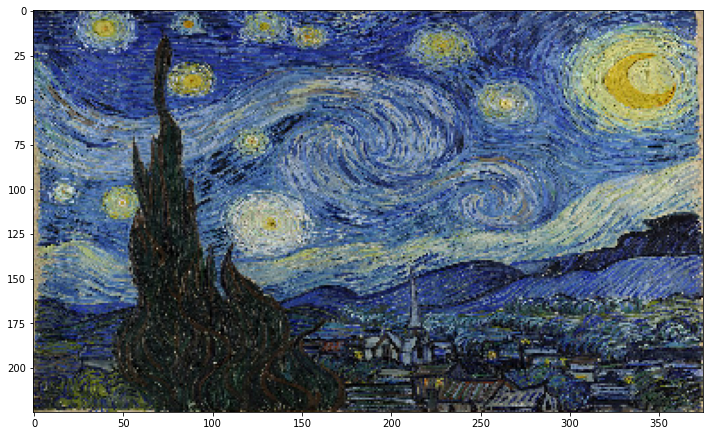

Step 0, loss 0.6217795610427856


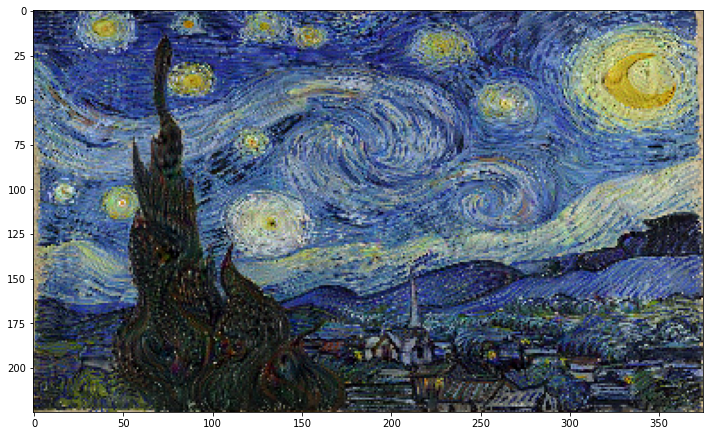

Step 100, loss 1.3856544494628906


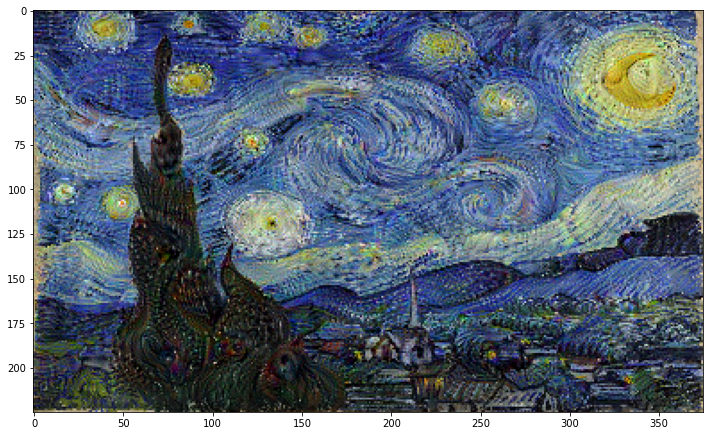

Step 200, loss 1.6996123790740967


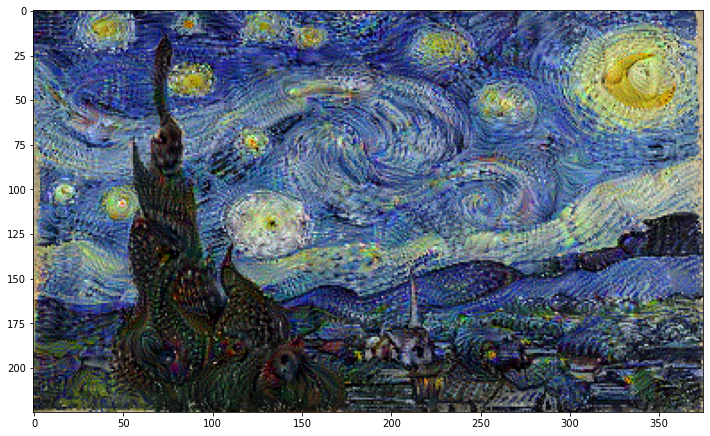

Step 300, loss 1.8895156383514404


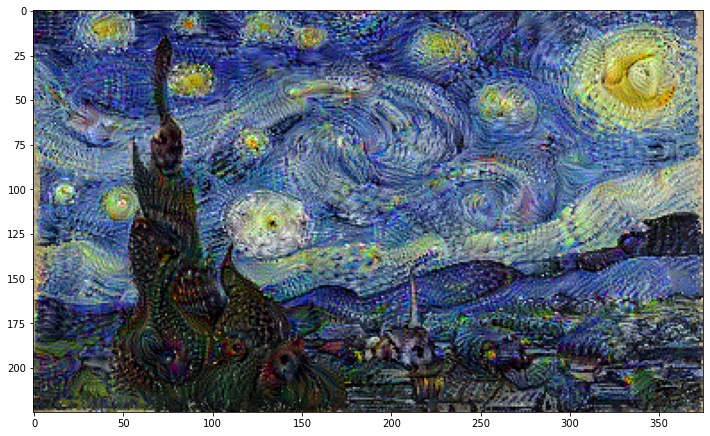

Step 400, loss 2.0284972190856934


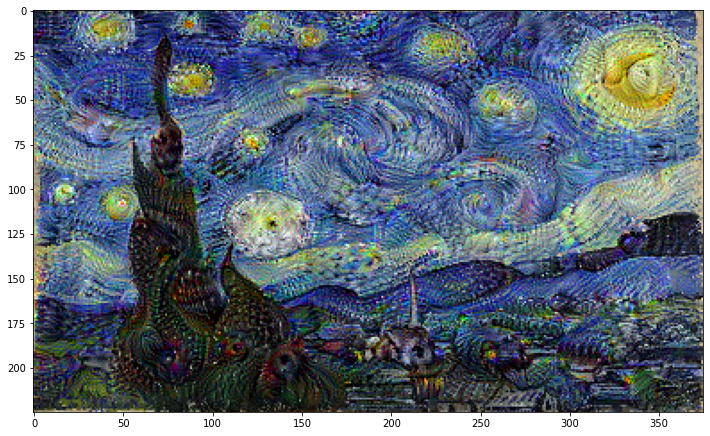

Step 500, loss 2.1381239891052246


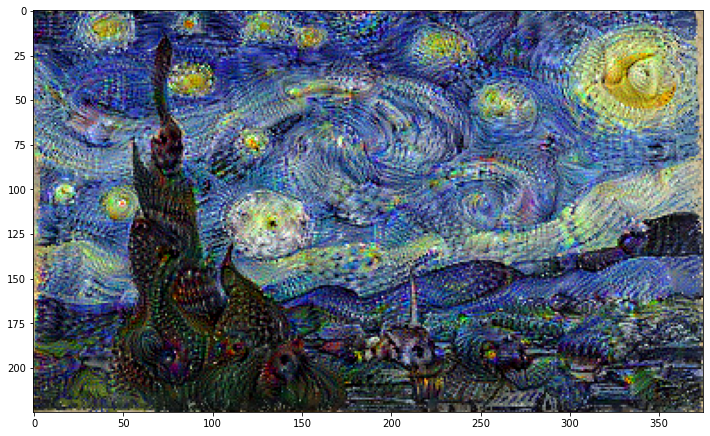

Step 600, loss 2.232518434524536


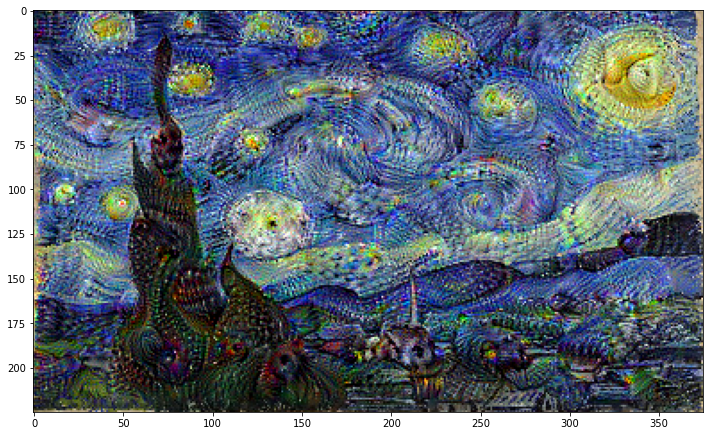

Step 700, loss 2.3134403228759766


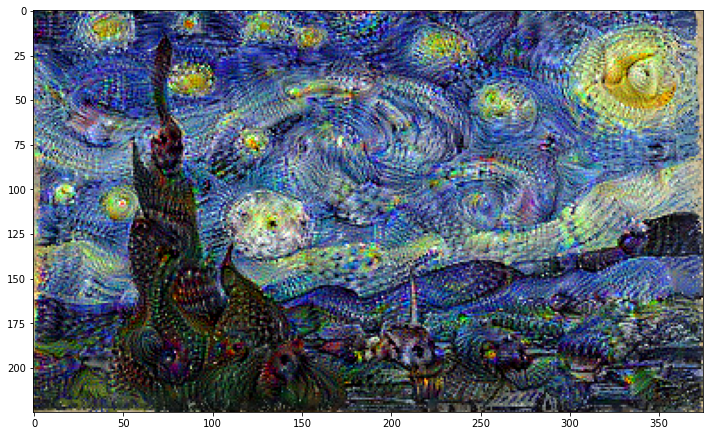

Step 800, loss 2.3849143981933594


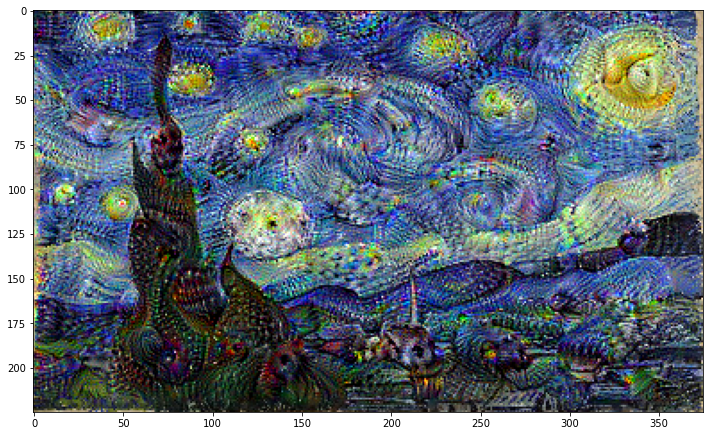

Step 900, loss 2.4513485431671143


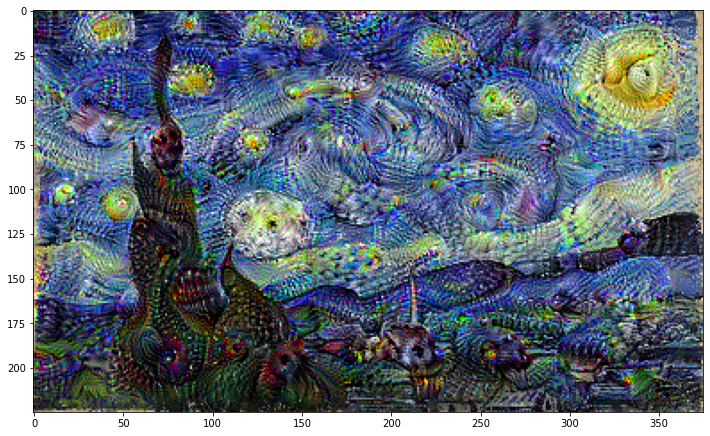

Step 1000, loss 2.513634204864502


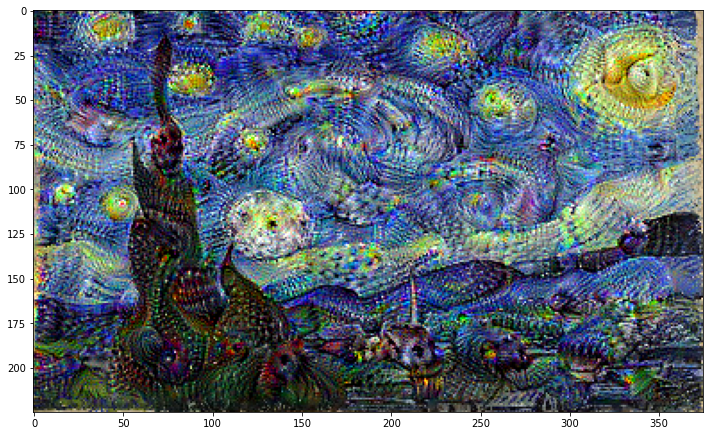

Step 1100, loss 2.571240186691284


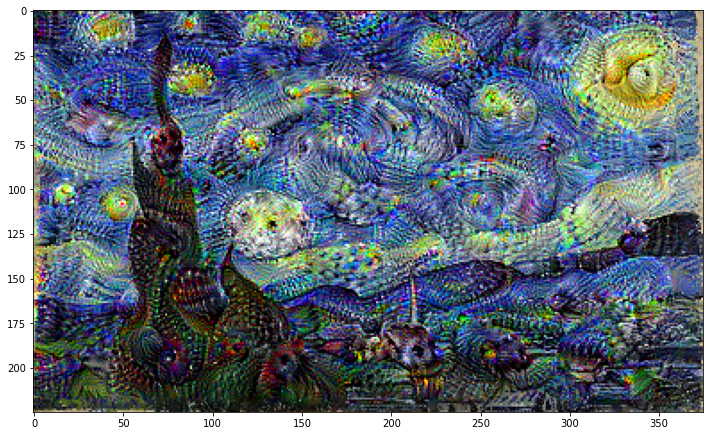

Step 1200, loss 2.623344898223877


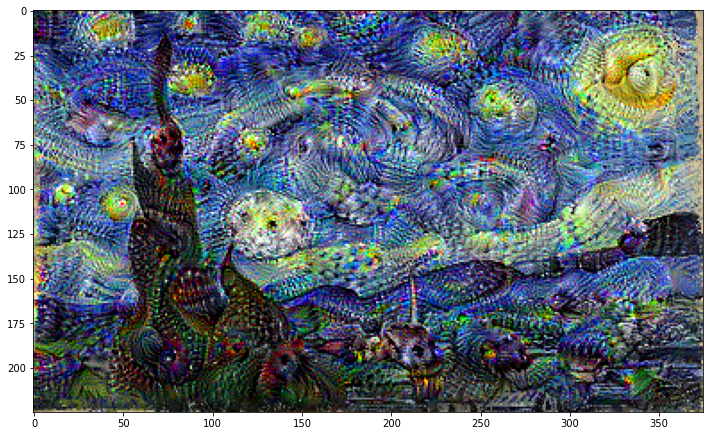

Step 1300, loss 2.6709275245666504


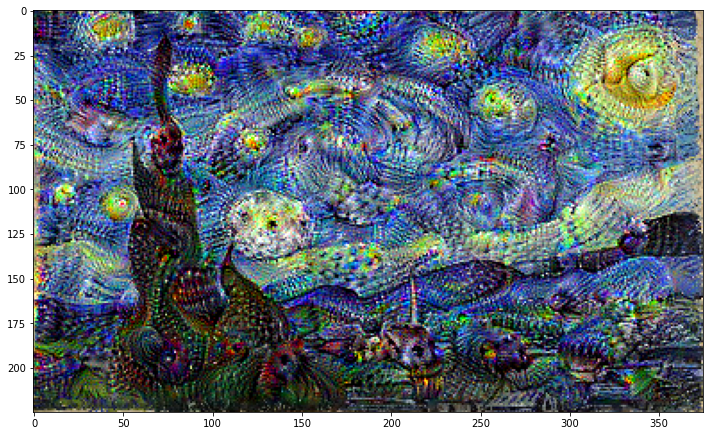

Step 1400, loss 2.716315269470215


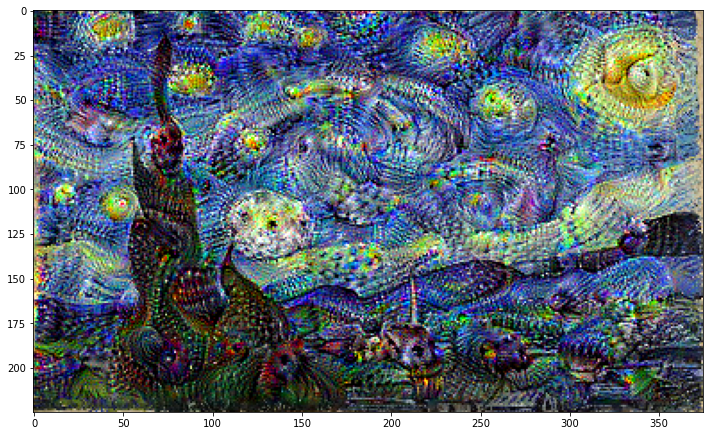

Step 1500, loss 2.7595646381378174


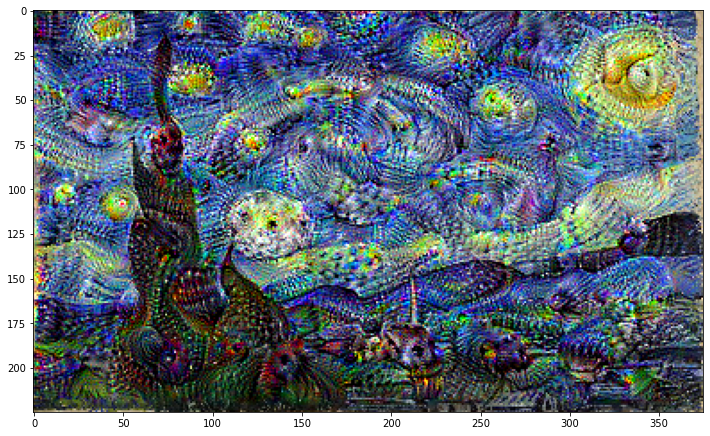

Step 1600, loss 2.8001723289489746


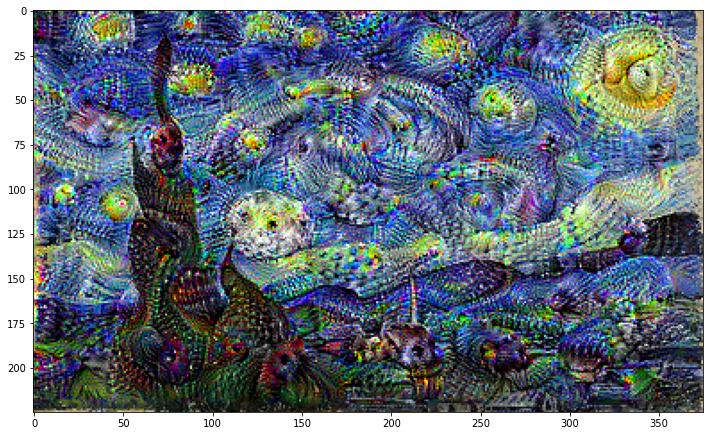

Step 1700, loss 2.838253974914551


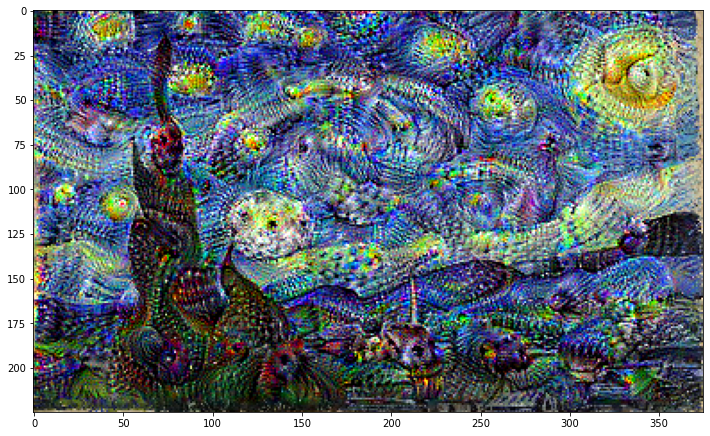

Step 1800, loss 2.874805212020874


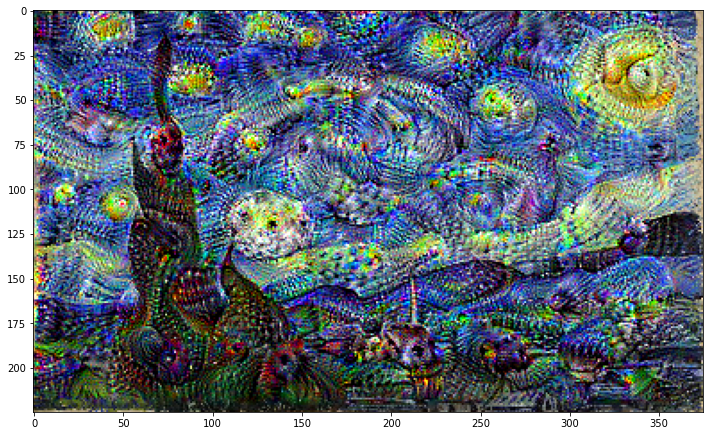

Step 1900, loss 2.9096648693084717


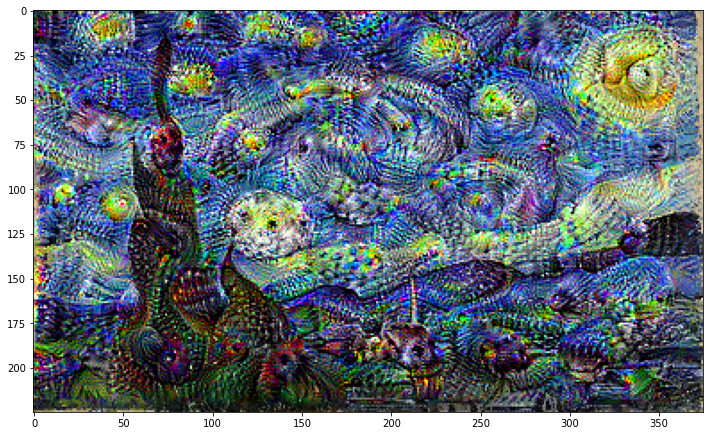

In [18]:
Sample_Image= tf.keras.preprocessing.image.load_img(r'/content/drive/My Drive/Colab Notebooks/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg', target_size = (225, 375))

Sample_Image = np.array(Sample_Image)
dream_img = run_deep_dream_simple(model=deepdream_model, image=Sample_Image, 
                                  steps=2000, step_size=0.001)